## Dynamics Learning and Localization (DLL) with 2 mass spring systems 


In [356]:
import numpy as np
import pysindy as ps
import scipy as sp

from scipy.integrate import odeint
from scipy.integrate import solve_ivp
from scipy.io import loadmat
from sklearn.linear_model import Lasso

import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
from matplotlib.cm import rainbow

from IPython.display import Image

In [357]:
differentiation_method = ps.FiniteDifference(order=2)

optimizer = ps.STLSQ(threshold=0.01)
lasso_optimizer = Lasso(alpha=0.001, max_iter=2000, fit_intercept=False)
sr3_optimizer = ps.SR3(threshold=0.1, nu=1)

poly_library = ps.PolynomialLibrary()
fourier_library = ps.FourierLibrary()
identity_library = ps.IdentityLibrary()
combined_library =  poly_library + identity_library + fourier_library

DLL is applied here following the derivation found in https://www.overleaf.com/project/5e5193431d431400019489a1 using the optimization functions...

## Initialization and trajectories

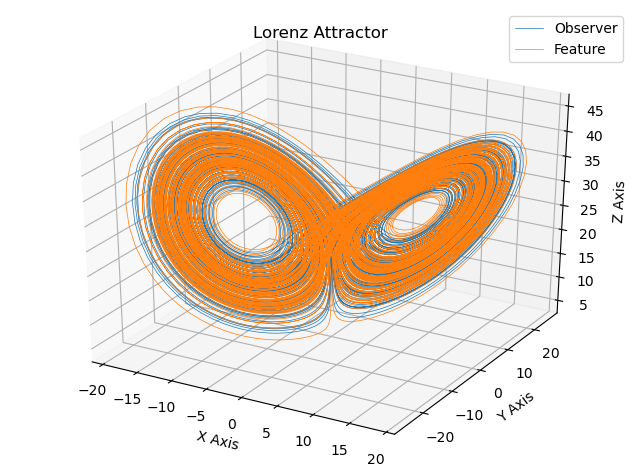

In [359]:
dt = .01 #integtration time step
tf = 150
t = np.arange(0, tf, dt) #integration length

sigma = 10
rho = 28
beta = 8/3
x0 = [0, 1, 20]
y0 = [10, 10, 20]
def lorenz(x, t, sigma, rho, beta):
    '''
    Given: 
        t: time
        x: states
        beta: parameters
    Return:
        dx: partial derivatives
    '''
    dx = [sigma*(x[1] - x[0]),
          x[0]*(rho - x[2]) - x[1],
          x[0]*x[1] - beta*x[2]]
                
    return dx

x = odeint(lorenz, x0, t, args = (sigma, rho, beta))
y = odeint(lorenz, y0, t, args = (sigma, rho, beta))

# Plot
fig = plt.figure(figsize=(8, 6), dpi= 100, facecolor='w', edgecolor='k')
ax = fig.gca(projection='3d')

ax.plot(x[:,0], x[:,1], x[:,2], lw=0.5, label='Observer')
ax.plot(y[:,0], y[:,1], y[:,2], lw=0.5, label='Feature')

ax.set_xlabel("X Axis")
ax.set_ylabel("Y Axis")
ax.set_zlabel("Z Axis")
ax.set_title("Lorenz Attractor")
ax.legend()

plt.show()

### Sytem Dynamics

<ipython-input-360-22ac26fdb033>:9: UserWarning: Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig1.show()
<ipython-input-360-22ac26fdb033>:19: UserWarning: Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig2.show()


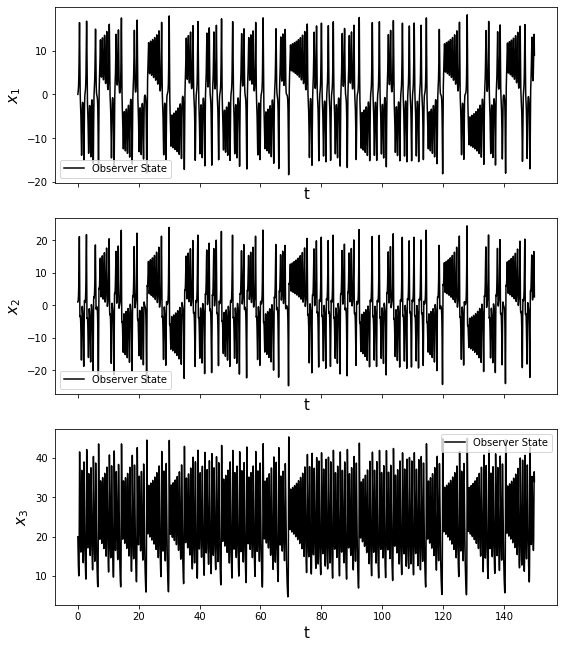

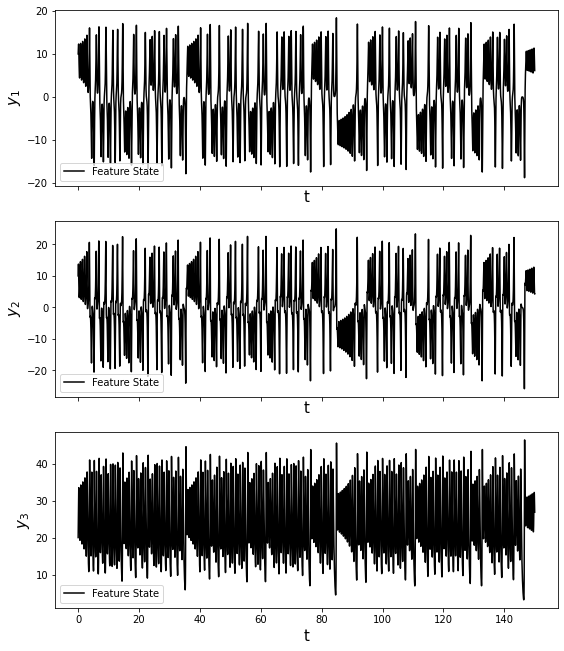

In [360]:
fig1, axs = plt.subplots(x.shape[1], 1, sharex=True, figsize=(9, 11))
for i in range(x.shape[1]):
    axs[i].plot(t, x[:, i], 'k', label='Observer State')
    #axs[i].plot(t_test, x_test_sim[:, i], 'r--', label='model simulation')
    axs[i].legend()
    #axs[i].set(xlabel='t', ylabel='$x_{}$'.format(i+1))
    axs[i].set_xlabel('t', fontsize = 15)
    axs[i].set_ylabel('$x_{}$'.format(i+1), fontsize = 15)
fig1.show()

fig2, axs = plt.subplots(y.shape[1], 1, sharex=True, figsize=(9, 11))
for i in range(y.shape[1]):
    axs[i].plot(t, y[:, i], 'k', label='Feature State')
    #axs[i].plot(t_test, x_test_sim[:, i], 'r--', label='model simulation')
    axs[i].legend()
    #axs[i].set(xlabel='t', ylabel='$x_{}$'.format(i+1))
    axs[i].set_xlabel('t', fontsize = 15)
    axs[i].set_ylabel('$y_{}$'.format(i+1), fontsize = 15)
fig2.show()

## Sindy Test

In [361]:
model = ps.SINDy(
    differentiation_method=differentiation_method,
    feature_library=poly_library,
    optimizer=optimizer, feature_names=["x", "y", "z"])
model.fit(x,t=dt)
model.print() 
model.score(x,t=dt)

x' = -9.978 x + 9.978 y
y' = 27.801 x + -0.961 y + -0.994 x z
z' = -2.659 z + 0.997 x y


0.9999902404764334

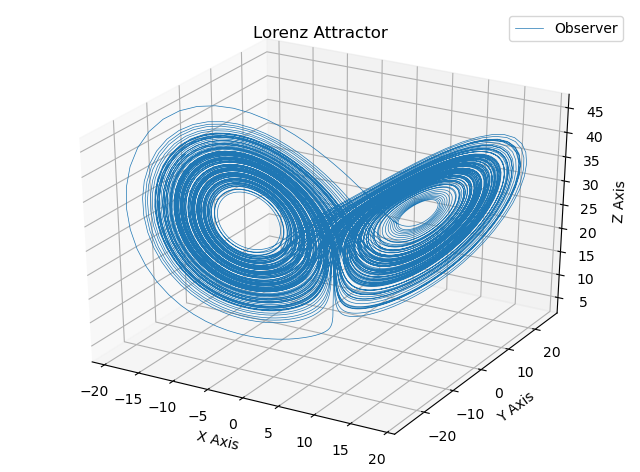

In [362]:
x_learned = model.simulate(x0, t)

# Plot Learned Dyanamical system
fig = plt.figure(figsize=(8, 6), dpi= 100, facecolor='w', edgecolor='k')
ax = fig.gca(projection='3d')

ax.plot(x_learned[:,0], x_learned[:,1], x_learned[:,2], lw=0.5, label='Observer')

ax.set_xlabel("X Axis")
ax.set_ylabel("Y Axis")
ax.set_zlabel("Z Axis")
ax.set_title("Lorenz Attractor")
ax.legend()

plt.show()

## Simulated Sensors

### Noisy relative position measurement

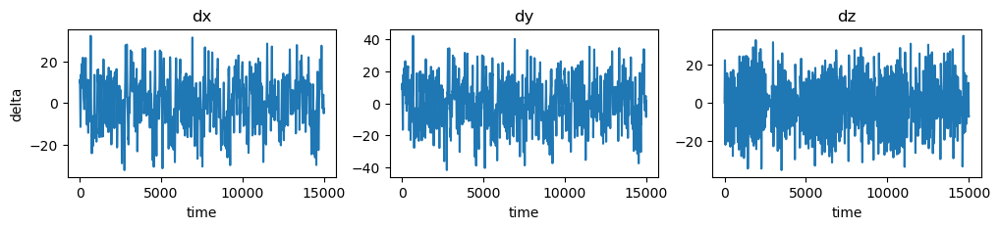

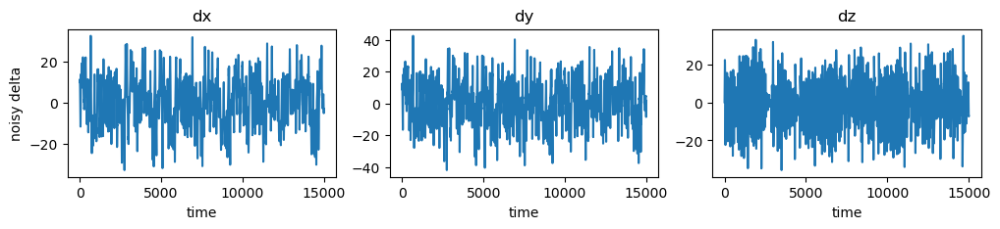

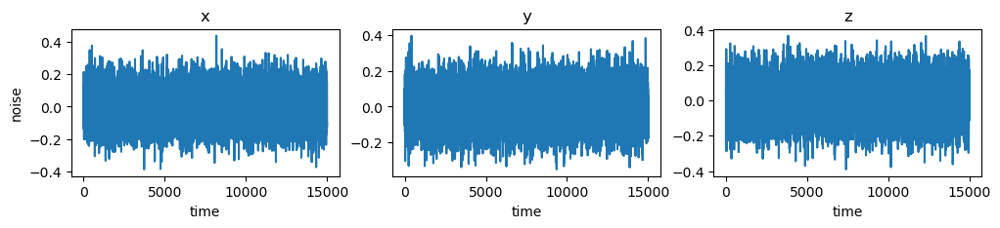

In [363]:
delta = y-x

#Stochastic sensor on the observer
rel_sense_mean = 0 #mean of relative measurement sensor
rel_sense_std = 0.1#[0,0]-y[0,0]) * 0.3 #standard deviation of relative measurement scales with the distance
delta_noise = delta + np.random.normal(rel_sense_mean,rel_sense_std,size=delta.shape)

fig = plt.figure(figsize=(12, 2), dpi= 100, facecolor='w', edgecolor='k')
ax1 = plt.subplot(1,3,1)
ax1.plot(delta[:,0])
ax1.set_xlabel('time')
ax1.set_ylabel('delta')
ax1.set_title('dx')
ax2 = plt.subplot(1,3,2)
ax2.plot(delta[:,1])
ax2.set_xlabel('time')
ax2.set_title('dy')
ax3 = plt.subplot(1,3,3)
ax3.plot(delta[:,2])
ax3.set_xlabel('time')
ax3.set_title('dz')
plt.show()

#Noisy relaitve position data
fig = plt.figure(figsize=(12, 2), dpi= 100, facecolor='w', edgecolor='k')
ax1 = plt.subplot(1,3,1)
ax1.plot(delta_noise[:,0])
ax1.set_xlabel('time')
ax1.set_ylabel('noisy delta')
ax1.set_title('dx')
ax2 = plt.subplot(1,3,2)
ax2.plot(delta_noise[:,1])
ax2.set_xlabel('time')
ax2.set_title('dy')
ax3 = plt.subplot(1,3,3)
ax3.plot(delta_noise[:,2])
ax3.set_xlabel('time')
ax3.set_title('dz')
plt.show()

#value of the noise at each time step
fig = plt.figure(figsize=(12, 2), dpi= 100, facecolor='w', edgecolor='k')
ax1 = plt.subplot(1,3,1)
ax1.plot(delta_noise[:,0]-delta[:,0])
ax1.set_xlabel('time')
ax1.set_ylabel('noise')
ax1.set_title('x')
ax2 = plt.subplot(1,3,2)
ax2.plot(delta_noise[:,1]-delta[:,1])
ax2.set_xlabel('time')
ax2.set_title('y')
ax3 = plt.subplot(1,3,3)
ax3.plot(delta_noise[:,2]-delta[:,2])
ax3.set_xlabel('time')
ax3.set_title('z')
plt.show()


### Noisy IMU sensor simulation + dead reconing


In [364]:
# acc = -param_1*x[:,0] #analytical acceleration

# #Stochastic IMU sensor parameters
# imu_mean = 0
# imu_std = 0.05

# #Simulated Noisy IMU
# acc_noise = acc+np.random.normal(imu_mean,imu_std,size=acc.shape)
# #Plot noisy acceleration over time
# plt.plot(t,acc_noise, label = 'Acceleration') 

# #Integrate Acceleration
# vel_noise = np.zeros(acc_noise.size-1)
# for jj in range(1,vel_noise.size):
#     vel_noise[jj] = acc_noise[jj-1]*dt+vel_noise[jj-1]
# plt.plot(t[0:vel_noise.size],vel_noise, label = 'Velocity') # dead reckoned velocity of observer over time

# #Integrate Velocity
# pos_noise = np.zeros(vel_noise.size-1)
# pos_noise[0] = x_0[0]
# for jj in range(1,pos_noise.size):
#     pos_noise[jj] = vel_noise[jj-1]*dt+pos_noise[jj-1]
# plt.plot(t[0:pos_noise.size],pos_noise, label = 'Position') # dead reckoned position of observer over time

# dead_reck = np.ones((x.shape[0], 2))
# #dead_reck = np.append(dead_reck, vel_noise, axis = 0)
# dead_reck[0:pos_noise.size,0] = pos_noise
# dead_reck[0:vel_noise.size,1] = vel_noise

# y_dead_reck = delta+dead_reck

# plt.title('Dead Reckoning Estimate')
# plt.legend()
# plt.xlabel('time')
# plt.ylabel('m/s^2, m/s, m')

## DLL Iterative/Filtering Optimization loop

In [365]:
#define cost function
def x_opt(x): #Position dimension cost function
    return (x[0] - x_up[0]) ** 2 * R_inv + (x[3] - y_up[0]) ** 2 * S_inv + (delta_noise[i,0] - (x[3]-x[0])) ** 2 * Q_inv

def y_opt(x): #Velocity dimension cost function   
    return (x[1] - x_up[1]) ** 2 * R_inv + (x[4] - y_up[1]) ** 2 * S_inv + (delta_noise[i,1] - (x[4]-x[1])) ** 2 * Q_inv

def z_opt(x): #Velocity dimension cost function   
    return (x[2] - x_up[2]) ** 2 * R_inv + (x[5] - y_up[2]) ** 2 * S_inv + (delta_noise[i,1] - (x[5]-x[2])) ** 2 * Q_inv

    #Full cost function in vector form.         
    #(np.array([x[0],x[1]]) - np.array(x_up)) ** 2 * R_inv + (np.array([x[2],x[3]]) - np.array(y_up)) ** 2 * S_inv + (delta_noise - np.array([x[2]-x[0],x[3]-x[1]]))        ** 2 * Q_inv}


In [366]:
#sinusoidal regression function
def sinusoid(tt, a, b, c, d):
    return a * np.sin(b * (tt+c))+d 
    

In [399]:
R_inv = 1#np.ones((2,1)) #Observer process information matrix
Q_inv = .1#np.ones((2,1)) #measurement information matrix
S_inv = 1#np.ones((2,1)) #Feature process information matrix
P_inv = 1#np.ones((2,1)) #Identification information matrix

x_est = x0 #initialize observer estimate
y_est = y0 #initialize feature estimate

y_up = y_est #initial feature process update

X = np.array([x_est]) # x_est history 
Y = np.array([y_est]) # y_est history

x_dead_reck = x_est
X_dead_reck = np.array([x_dead_reck])

params = np.array([[1,1,1,1], [1,1,1,1]])
B = np.array([params])

x_up_std= 0.5

for i in range (14500):#int(tf/dt)-1):
    t_sim = i*dt
    
    #Dead Reckoning baseline estimate
    x_dead_reck = odeint(lorenz, x_dead_reck, [t_sim,t_sim+dt], args = (sigma, rho, beta))
    x_dead_reck = x_dead_reck[1,::
    x_dead_reck = x_dead_reck + np.random.normal(0,x_up_std,size=x_up.shape),1]
    X_dead_reck = np.append(X_dead_rec[k, x_dead_r]eck, axis=0)

    #calculate the Observer process update f(x_k-1) with noise
    x_up = odeint(lorenz, x_est, [t_sim,t_sim+dt], args = (sigma, rho, beta)) 
    x_up = x_up[1,:] 
    x_up = x_up + np.random.normal(0,x_up_std,size=x_up.shape)

    #y_up = [sinusoid(t_sim+dt, *params[0]), sinusoid(t_sim+dt, *params[1])] #feature process update
 #   y_up = delta_noise[i,+] - x_up

    #minimize one time step (Filterin
    x_init = upest,upest] #set optimization initial conditionsg!)
    x_min = sp.optimize.minimize(x_opt, x_init) #minimize position dimension
    y_min = sp.optimize.minimize(y_opt, x_init) #minimize velocity dimension
    z_min = sp.optimize.minimize(z_opt, x_init) #minimize velocity dimension

 #Save x_est
    x_est = np.array([x_min.x[0], y_min.x[1], z_min.x[2]]) # save x_est
    X = np.append(X, [x_est], axis=0) #update trajectory
 #Save y_est
    y_est = np.array([x_min.x[3], y_min.x[4], z_min.x[5]]) #save y_est
    Y = np.append(Y, [y_est], axis=0) #update trajecto

    #Dynamics Learningry

  # if i >0 99: #delay model learning for a number of time st eps
  #     if i00100 == 0:
  #     #(SINDY)
  #         model.fit(Y,t = dt)   
  #         model.print()
  #     #calculate the feature process update based on most recent dynamics estimate g(y_k-1)
  #         y_up = model.simulate(y_est,[t_sim,t_sim+dt])
  #         y_up = y_up[1,:]
  #     else:
  #         y_up = model.simulate(y_est,[t_sim,t_sim+dt])
  #         y_up = y_up[1,:] 
  # else:
  #     y_up = delta_noise[i,+] - x_        # y_up = model.simulate(y_est,[t_sim,t_sim+dt])
        # y_up = y_up[1,:] 
up

    #Sinusoidal Regression 
    #     pos_params, pos_params_cov = sp.optimize.curve_fit(sinusoid, t[0:Y.shape[0]], Y[:,0])
    #     vel_params, vel_params_cov = sp.optimize.curve_fit(sinusoid, t[0:Y.shape[0]], Y[:,1])
    #     params = np.array([pos_params, vel_params])
    #     B = np.append(B, [params], axis = 0)
    # else:
    #     B = np.append(B, [params], axis = 0)


x' = -0.090 1 + -9.020 x + 9.068 y + 0.070 z
y' = -106.530 1 + -10.312 x + 11.895 y + 4.551 z + 0.016 x^2 + -0.038 x y + -0.180 x z + 0.051 y^2 + -0.101 y z + -0.047 z^2
z' = -117.008 1 + 16.656 x + -21.492 y + 2.113 z + -0.293 x^2 + 0.549 x y + -0.191 x z + 0.031 y^2 + 0.260 y z + -0.011 z^2
x' = 0.962 1 + -9.109 x + 9.166 y + 0.063 z
y' = -102.962 1 + -10.253 x + 11.828 y + 4.546 z + 0.022 x^2 + -0.034 x y + -0.185 x z + 0.048 y^2 + -0.100 y z + -0.048 z^2
z' = -86.695 1 + 15.246 x + -18.826 y + 2.004 z + -0.262 x^2 + 0.441 x y + -0.173 x z + 0.051 y^2 + 0.220 y z + -0.017 z^2
x' = 2.830 1 + -8.817 x + 9.068 y + 0.087 z
y' = -94.375 1 + -9.629 x + 11.651 y + 4.357 z + 0.050 x^2 + -0.060 x y + -0.172 x z + 0.048 y^2 + -0.109 y z + -0.044 z^2
z' = -68.935 1 + 13.703 x + -16.160 y + 1.413 z + -0.245 x^2 + 0.420 x y + -0.149 x z + 0.069 y^2 + 0.187 y z + -0.014 z^2
x' = 3.359 1 + -8.819 x + 9.114 y + 0.102 z
y' = -91.572 1 + -9.299 x + 11.486 y + 4.437 z + 0.030 x^2 + -0.043 x y + -0.175

In [400]:
Y_dead_reck = delta_noise[0:X_dead_reck.shape[0],:]+X_dead_reck
YY = delta_noise + x 

### Plot estimated trajectories & Error


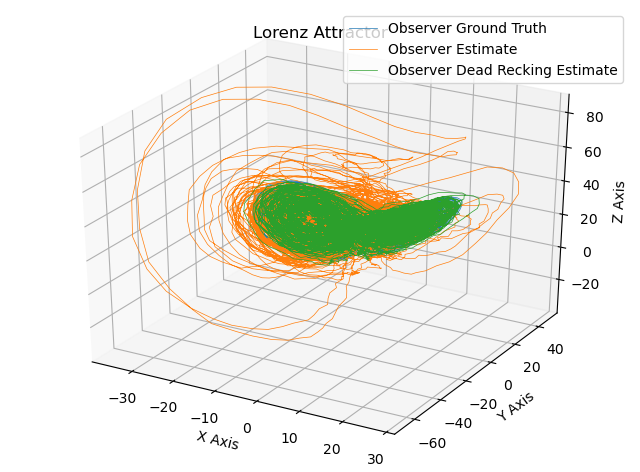

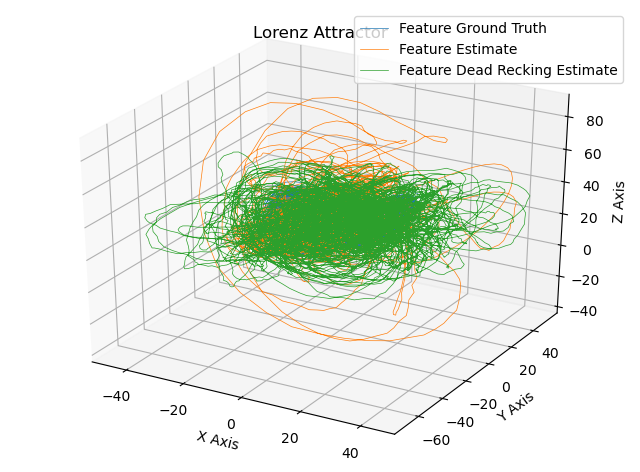

In [401]:
# Plot
fig = plt.figure(figsize=(8, 6), dpi= 100, facecolor='w', edgecolor='k')
ax = fig.gca(projection='3d')
ax.plot(x[:,0], x[:,1], x[:,2], lw=0.5, label='Observer Ground Truth')
ax.plot(X[:,0], X[:,1], X[:,2], lw=0.5, label='Observer Estimate')
ax.plot(X_dead_reck[:,0], X_dead_reck[:,1], X_dead_reck[:,2], lw=0.5, label='Observer Dead Recking Estimate')
ax.set_xlabel("X Axis")
ax.set_ylabel("Y Axis")
ax.set_zlabel("Z Axis")
ax.set_title("Lorenz Attractor")
ax.legend()
plt.show()

fig = plt.figure(figsize=(8, 6), dpi= 100, facecolor='w', edgecolor='k')
ax = fig.gca(projection='3d')
ax.plot(y[:,0], y[:,1], y[:,2], lw=0.5, label='Feature Ground Truth')
ax.plot(Y[:,0], Y[:,1], Y[:,2], lw=0.5, label='Feature Estimate')
ax.plot(Y_dead_reck[:,0], Y_dead_reck[:,1], Y_dead_reck[:,2], lw=0.5, label='Feature Dead Recking Estimate')
ax.set_xlabel("X Axis")
ax.set_ylabel("Y Axis")
ax.set_zlabel("Z Axis")
ax.set_title("Lorenz Attractor")
ax.legend()
plt.show()

<ipython-input-402-e416d42ef8a9>:10: UserWarning: Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig1.show()
<ipython-input-402-e416d42ef8a9>:22: UserWarning: Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig2.show()
<ipython-input-402-e416d42ef8a9>:33: UserWarning: Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig3.show()
<ipython-input-402-e416d42ef8a9>:44: UserWarning: Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig4.show()


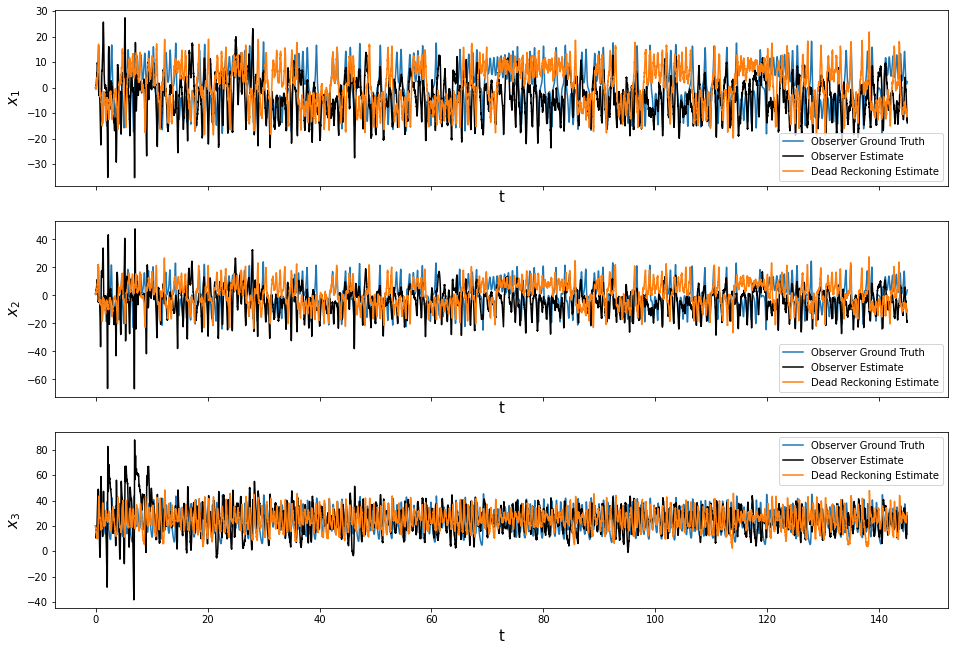

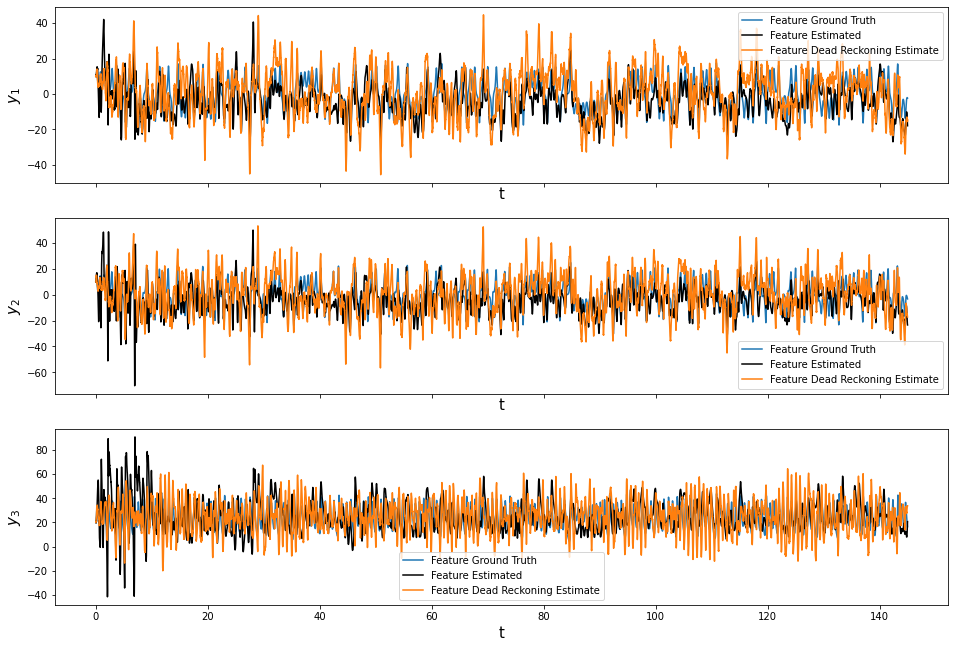

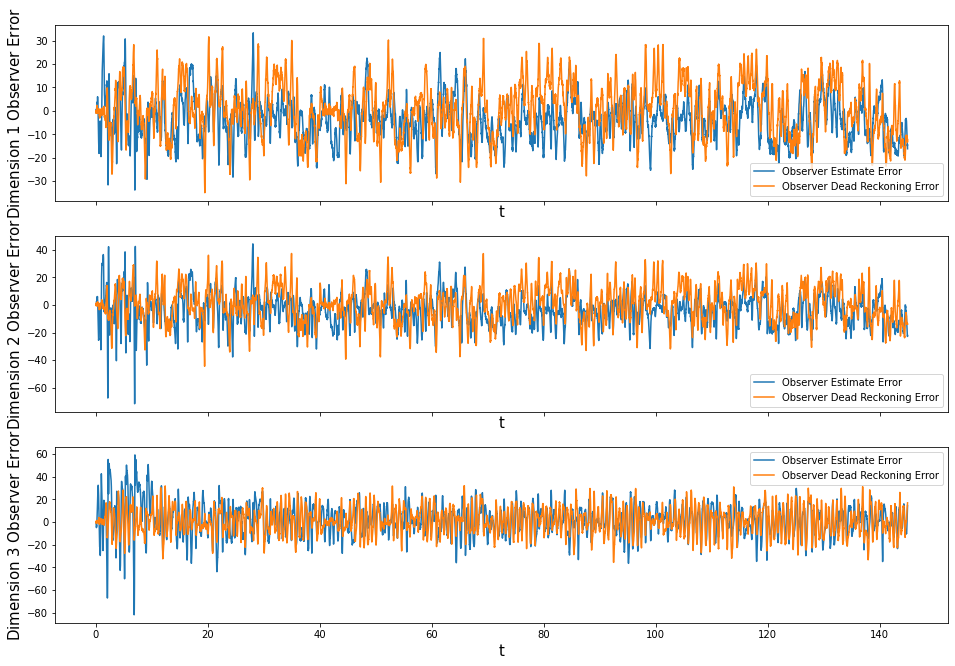

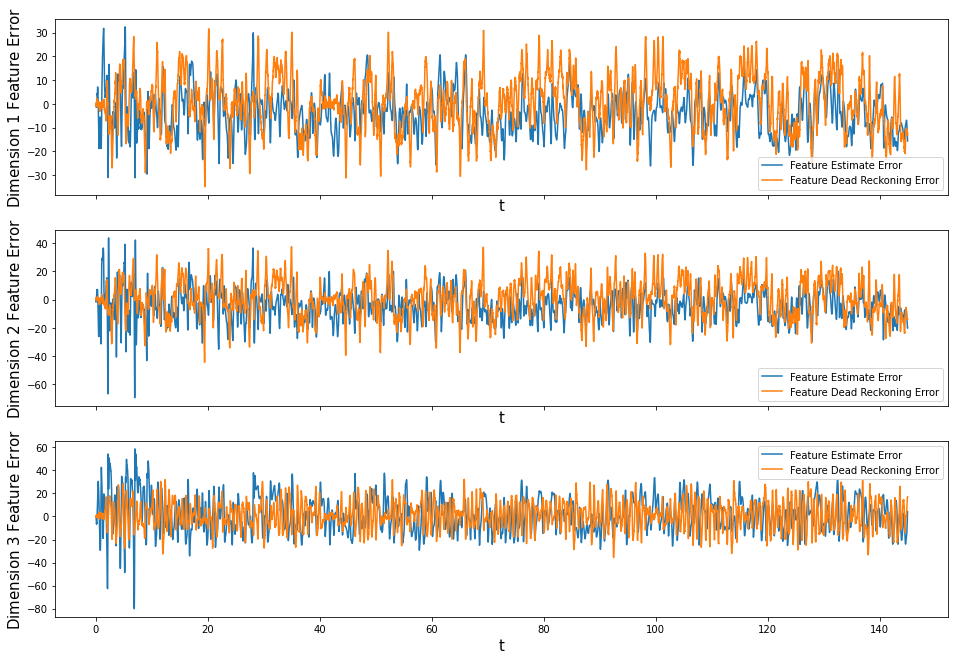

In [402]:
fig1, axs = plt.subplots(X.shape[1], 1, sharex=True, figsize=(16, 11))
for i in range(X.shape[1]):
    axs[i].plot(t[0:X.shape[0]], x[0:X.shape[0], i] , label='Observer Ground Truth')
    axs[i].plot(t[0:X.shape[0]], X[:, i], 'k', label='Observer Estimate')
    axs[i].plot(t[0:X.shape[0]], X_dead_reck[0:X.shape[0], i], label='Dead Reckoning Estimate')
    #axs[i].plot(t_test, x_test_sim[:, i], 'r--', label='model simulation')
    axs[i].legend()
    axs[i].set_xlabel('t', fontsize = 15)
    axs[i].set_ylabel('$x_{}$'.format(i+1), fontsize = 15)
fig1.show()

fig2, axs = plt.subplots(Y.shape[1], 1, sharex=True, figsize=(16, 11))
for i in range(Y.shape[1]):
    axs[i].plot(t[0:Y.shape[0]], y[0:Y.shape[0], i], label='Feature Ground Truth')
    axs[i].plot(t[0:Y.shape[0]], Y[:, i], 'k', label='Feature Estimated')
    #axs[i].plot(t[0:Y.shape[0]], y_learn[:, i], 'r--', label='model simulation')
    #axs[i].plot(t[0:Y.shape[0]], sinusoid(t[0:Y.shape[0]], *params[i]), 'r--', label='Feature Learned Model')
    axs[i].plot(t[0:Y.shape[0]], Y_dead_reck[0:Y.shape[0], i], label='Feature Dead Reckoning Estimate')
    axs[i].legend()
    axs[i].set_xlabel('t', fontsize = 15)
    axs[i].set_ylabel('$y_{}$'.format(i+1), fontsize = 15)
fig2.show()

fig3, axs = plt.subplots(Y.shape[1], 1, sharex=True, figsize=(16, 11))
for i in range(Y.shape[1]):
    axs[i].plot(t[0:X.shape[0]], X[:, i] - x[0:X.shape[0], i], label='Observer Estimate Error')
    axs[i].plot(t[0:X.shape[0]], X_dead_reck[0:X.shape[0], i] - x[0:X.shape[0], i], label='Observer Dead Reckoning Error')
    #axs[i].plot(t[0:X.shape[0]], Y[:, i] - y[0:X.shape[0], i], label='Feature Estimate Error')
    #axs[i].plot(t[0:Y.shape[0]], Y_dead_reck[:, i] - y[0:X.shape[0], i], label='Feature Dead Reckoning Error')
    axs[i].legend()
    axs[i].set_xlabel('t', fontsize = 15)
    axs[i].set_ylabel('Dimension ${}$ Observer Error'.format(i+1), fontsize = 15)
fig3.show()

fig4, axs = plt.subplots(Y.shape[1], 1, sharex=True, figsize=(16, 11))
for i in range(Y.shape[1]):
    #axs[i].plot(t[0:X.shape[0]], X[:, i] - x[0:X.shape[0], i], label='Observer Estimate Error')
    #axs[i].plot(t[0:X.shape[0]], X_dead_reck[0:X.shape[0], i] - x[0:X.shape[0], i], label='Observer Dead Reckoning Error')
    axs[i].plot(t[0:X.shape[0]], Y[:, i] - y[0:X.shape[0], i], label='Feature Estimate Error')
    axs[i].plot(t[0:Y.shape[0]], Y_dead_reck[:, i] - y[0:X.shape[0], i], label='Feature Dead Reckoning Error')
    axs[i].legend()
    axs[i].set_xlabel('t', fontsize = 15)
    axs[i].set_ylabel('Dimension ${}$ Feature Error'.format(i+1), fontsize = 15)
fig4.show()

### Cumulative error

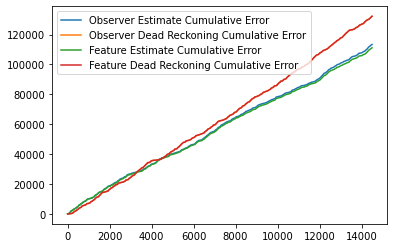

In [403]:
X_cum = np.array([])
X_cum_dead = np.array([])
Y_cum = np.array([])
Y_cum_dead = np.array([])

for j in range(X.shape[0]):
    x_cum = np.sum(np.abs((X - x[0:X.shape[0], :])[0:j,:]) , axis=0)
    X_cum = np.append(X_cum, [x_cum[0]], axis=0)

    x_cum_dead = np.sum(np.abs((X_dead_reck - x[0:X.shape[0], :])[0:j,:]) , axis=0)
    X_cum_dead = np.append(X_cum_dead, [x_cum_dead[0]], axis=0)

    y_cum = np.sum(np.abs((Y - y[0:X.shape[0], :])[0:j,:]) , axis=0)
    Y_cum = np.append(Y_cum, [y_cum[0]], axis=0)

    y_cum_dead = np.sum(np.abs((Y_dead_reck - y[0:X.shape[0], :])[0:j,:]) , axis=0)
    Y_cum_dead = np.append(Y_cum_dead, [y_cum_dead[0]], axis=0)

plt.plot(np.arange(0,j+1), X_cum, label = 'Observer Estimate Cumulative Error')
plt.plot(np.arange(0,j+1), X_cum_dead, label = 'Observer Dead Reckoning Cumulative Error')
plt.plot(np.arange(0,j+1), Y_cum, label = 'Feature Estimate Cumulative Error')
plt.plot(np.arange(0,j+1), Y_cum_dead, label = 'Feature Dead Reckoning Cumulative Error')

plt.legend()


## DLL Global Optimization Loop

## NOTES


In [420]:
model = ps.SINDy(
    differentiation_method=differentiation_method,
    feature_library=poly_library,
    optimizer=Lasso(alpha=2000, max_iter=2000, fit_intercept=False), feature_names=["x", "y", "z"])
model.fit(X,t=dt)
model.print() 

x' = -0.198 x z + -0.060 y^2 + 0.199 y z + 0.007 z^2
y' = -0.344 x z + -0.112 y^2 + 0.102 y z
z' = 0.468 x y + 0.101 y^2 + 0.002 y z + -0.037 z^2


In [405]:
y_up = model.simulate(y_est,[t_sim,t_sim+dt])
y_up[1,:]

array([-18.46764852, -23.24429701,  21.81993982])

In [406]:
X_cum

array([0.00000000e+00, 0.00000000e+00, 4.49003377e-01, ...,
       1.13287128e+05, 1.13301380e+05, 1.13316522e+05])